In [7]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import RobustScaler, FunctionTransformer
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import plotly.express as px

In [8]:
X_train = pd.read_csv(os.path.join(os.getcwd(), "data", "X_train.csv"))
X_test = pd.read_csv(os.path.join(os.getcwd(), "data", "X_test.csv"))
y_train = pd.read_csv(os.path.join(os.getcwd(), "data", "y_train.csv"))
y_test = pd.read_csv(os.path.join(os.getcwd(), "data", "y_test.csv"))

In [9]:
def log_transform(x):
    return np.log(x+1-x.min())

numerical_features = ["age", "balance", "duration", "campaign", "pdays", "previous","last_contact_day"]
categorical_features = [col for col in X_train.columns if col not in numerical_features]

from imblearn.over_sampling import SMOTENC
categorical_features_index = [list(X_train.columns).index(col) for col in categorical_features]
smote_nc = SMOTENC(categorical_features=categorical_features_index, random_state=0, sampling_strategy=0.4)
X_train, y_train = smote_nc.fit_resample(X_train, y_train)

vars = ["duration", "campaign", "pdays", "previous"]
log_transform=FunctionTransformer(log_transform)
log_transform.fit(X_train[vars])
X_train[vars] = log_transform.transform(X_train[vars])
X_test[vars] = log_transform.transform(X_test[vars])

rbst=RobustScaler()
rbst.fit(X_train[numerical_features])
X_train[numerical_features] = rbst.transform(X_train[numerical_features])
X_test[numerical_features] = rbst.transform(X_test[numerical_features])

# Histogram
fig = px.histogram(X_train[numerical_features].melt(), x='value', facet_col='variable').update_xaxes(matches=None).update_yaxes(matches=None)
fig.show()

In [10]:
X_train = pd.get_dummies(X_train, columns = categorical_features)
X_test = pd.get_dummies(X_test, columns = categorical_features)

In [11]:
X_train

,age,balance,duration,campaign,pdays,previous,last_contact_day,job_admin.,job_blue-collar,job_entrepreneur,...,housing_yes,loan_no,loan_yes,contact_cellular,contact_telephone,contact_unknown,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,0.266667,-0.173872,-0.534832,0.630930,5.916202,1.098612,-0.280317,0,1,0,...,1,0,1,1,0,0,0,1,0,0
1,0.400000,-0.339625,1.093344,0.000000,4.532599,1.791759,0.560634,0,1,0,...,1,1,0,1,0,0,0,0,1,0
2,1.000000,1.805021,-0.346881,0.000000,5.786897,1.609438,-0.571847,0,1,0,...,1,1,0,0,1,0,1,0,0,0
3,1.333333,1.386916,-0.442378,0.369070,0.000000,0.000000,0.672761,1,0,0,...,0,0,1,1,0,0,0,0,0,1
4,-0.600000,-0.339625,0.429866,1.000000,0.000000,0.000000,0.852164,0,0,0,...,0,1,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37432,-0.099467,1.363321,0.315446,0.130795,5.176451,1.514092,0.655613,0,0,0,...,0,1,0,1,0,0,0,1,0,0
37433,1.990669,-0.033882,0.398064,-0.401492,0.000000,0.000000,0.275609,0,0,0,...,0,1,0,1,0,0,0,0,0,1
37434,0.950512,0.213894,1.220204,-0.347842,0.000000,0.000000,0.022283,0,1,0,...,1,1,0,0,0,1,0,0,0,1
37435,0.384556,-0.330815,0.087578,-0.630930,0.000000,0.000000,0.766378,0,0,0,...,0,1,0,1,0,0,0,0,0,1


In [5]:
fig = px.histogram(X_train[numerical_features].melt(), x='value', facet_col='variable').update_xaxes(matches=None).update_yaxes(matches=None)
fig.show()

In [6]:
y_train.value_counts() / len(y_train)

y
0    0.71429
1    0.28571
dtype: float64

In [7]:
X_train.shape

(37363, 39)

In [8]:
model = LogisticRegressionCV(cv=5,max_iter=1000,random_state=0)
#model = LogisticRegression(max_iter=1000,random_state=0)

Accuracy: 0.90 - Precision: 0.57 - Recall: 0.37 - F1 Score: 0.45


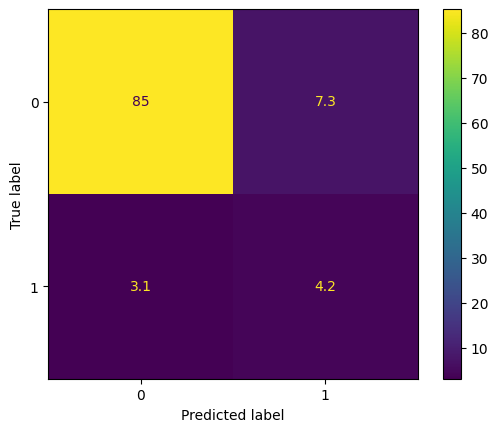

In [9]:
# Fit the classifier
model.fit(X_train, y_train.values.ravel())

# Make predictions
predictions = model.predict(X_test)

# Calculate metrics
accuracy = accuracy_score(predictions, y_test.values.ravel())
precision = precision_score(predictions, y_test.values.ravel())
recall = recall_score(predictions, y_test.values.ravel())
f1score = f1_score(predictions, y_test.values.ravel())

cm = 100 * confusion_matrix(y_test.values.ravel(), predictions, labels=model.classes_) / len(y_test.values.ravel())
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)

print(f"Accuracy: {accuracy:.2f} - Precision: {precision:.2f} - Recall: {recall:.2f} - F1 Score: {f1score:.2f}")
disp.plot()
plt.show()

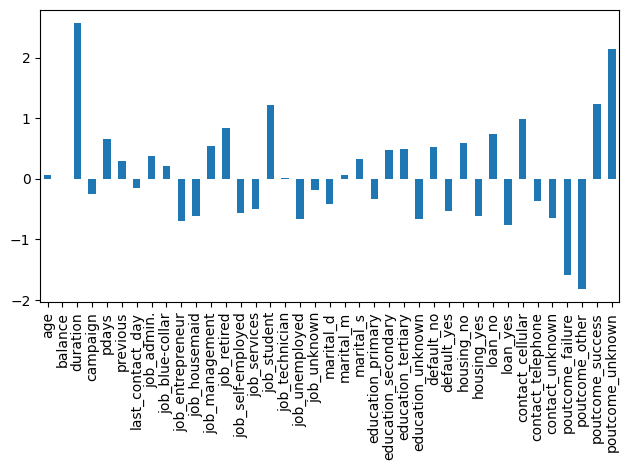

In [10]:
importances = pd.Series(model.coef_[0], index=model.feature_names_in_)
fig, ax = plt.subplots()
importances.plot.bar()
fig.tight_layout()